##### Copyright 2019 The TensorFlow Authors.

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# CycleGAN

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cyclegan"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This notebook demonstrates unpaired image to image translation using conditional GAN's, as described in [Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks](https://arxiv.org/abs/1703.10593), also known as CycleGAN. The paper proposes a method that can capture the characteristics of one image domain and figure out how these characteristics could be translated into another image domain, all in the absence of any paired training examples. 

This notebook assumes you are familiar with Pix2Pix, which you can learn about in the [Pix2Pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix). The code for CycleGAN is similar, the main difference is an additional loss function, and the use of unpaired training data.

CycleGAN uses a cycle consistency loss to enable training without the need for paired data. In other words, it can translate from one domain to another without a one-to-one mapping between the source and target domain. 

This opens up the possibility to do a lot of interesting tasks like photo-enhancement, image colorization, style transfer, etc. All you need is the source and the target dataset (which is simply a directory of images).

![Output Image 1](images/horse2zebra_1.png)
![Output Image 2](images/horse2zebra_2.png)

## Set up the input pipeline

In [2]:
!pip install -q git+https://github.com/tensorflow/examples.git

You should consider upgrading via the '/home/qci/anaconda3/envs/tensorflow-2/bin/python -m pip install --upgrade pip' command.


In [3]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import cv2
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

tfds.disable_progress_bar()
AUTOTUNE = tf.data.experimental.AUTOTUNE

## Input Pipeline

This tutorial trains a model to translate from images of horses, to images of zebras. You can find this dataset and similar ones [here](https://www.tensorflow.org/datasets/datasets#cycle_gan). 

As mentioned in the [paper](https://arxiv.org/abs/1703.10593), apply random jittering and mirroring to the training dataset. These are some of the image augmentation techniques that avoids overfitting.

This is similar to what was done in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#load_the_dataset)

* In random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.
* In random mirroring, the image is randomly flipped horizontally i.e left to right.

In [4]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMAGE_WIDTH = 1024
IMAGE_HEIGHT = 1024

In [5]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMAGE_HEIGHT, IMAGE_WIDTH, 3])

  return cropped_image

In [6]:
# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

In [7]:
def resize(input_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image

In [8]:
def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = resize(image, IMAGE_HEIGHT+100, IMAGE_WIDTH+100)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

In [9]:
def crop_image_into_patches(image, image_name):
    # crop 1944x2592x3 image into six 1024x1024x3 patches
    #image=tf.expand_dims(image, axis=0)
    print(image_name)
    patches = tf.image.extract_patches(images=image,
                           sizes=[1,IMAGE_HEIGHT, IMAGE_WIDTH, 1],
                           strides=[1,920, 784, 1],
                           rates=[1, 1, 1, 1],
                           padding='VALID')
    reshaped_patches = tf.reshape(patches,[-1,IMAGE_HEIGHT,IMAGE_WIDTH,3])
    return reshaped_patches


## Input Pipeline

In [10]:
train_root_image_path = '../../TfResearch/research/object_detection/dataset_tools/assets/images_train/'
valid_root_image_path = '../../TfResearch/research/object_detection/dataset_tools/assets/images_valid/'
test_root_image_path = '../../TfResearch/research/object_detection/dataset_tools/assets/images_test/'

In [11]:
def load_training_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.cast(image, tf.float32)
    image = normalize(image)

    return image

In [12]:
def load_predict_image(image_path):
    image_name = tf.strings.regex_replace(image_path, train_root_image_path, '')
    image_name = tf.strings.regex_replace(image_name, valid_root_image_path, '')
    image_name = tf.strings.regex_replace(image_name, test_root_image_path, '')
    
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.cast(image, tf.float32)
    image = normalize(image)

    return (image, image_name)

In [13]:
unstained_train_dataset_names = tf.data.Dataset.list_files(train_root_image_path + '*.png')
unstained_valid_dataset_names = tf.data.Dataset.list_files(valid_root_image_path + '*.png')
unstained_test_dataset_names = tf.data.Dataset.list_files(test_root_image_path + '*.png')

unstained_train_dataset = unstained_train_dataset_names.map(load_predict_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache().batch(1)
unstained_valid_dataset = unstained_valid_dataset_names.map(load_predict_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache().batch(1)
unstained_test_dataset = unstained_test_dataset_names.map(load_predict_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache().batch(1)

In [14]:
stained_training_names = tf.data.Dataset.list_files('generated/training_stained/*.png')
unstained_training_names = tf.data.Dataset.list_files('generated/training_unstained/*.png')

In [15]:
stained_training_dataset = stained_training_names.map(load_training_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)
unstained_training_dataset = unstained_training_names.map(load_training_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)

In [16]:
'''
def concat_images_in_dataset(input_dataset):
    counter = 0
    for a_dataset in input_dataset:
        a_dataset = tf.data.Dataset.from_tensor_slices(a_dataset)
        if counter == 0:
            total_dataset = a_dataset
        else:
            total_dataset = total_dataset.concatenate(a_dataset)
        counter = counter + 1
        print(counter)
    print(total_dataset)
    return total_dataset

cropped_stained_dataset = concat_images_in_dataset(cropped_stained_dataset).batch(1)
cropped_unstained_dataset = concat_images_in_dataset(cropped_unstained_dataset).batch(1)

sample_stained = cropped_stained_dataset[0]
sample_stained = tf.expand_dims(sample_stained, axis=0)
sample_unstained = cropped_unstained_dataset[0]
sample_unstained = tf.expand_dims(sample_unstained, axis=0)
'''

'\ndef concat_images_in_dataset(input_dataset):\n    counter = 0\n    for a_dataset in input_dataset:\n        a_dataset = tf.data.Dataset.from_tensor_slices(a_dataset)\n        if counter == 0:\n            total_dataset = a_dataset\n        else:\n            total_dataset = total_dataset.concatenate(a_dataset)\n        counter = counter + 1\n        print(counter)\n    print(total_dataset)\n    return total_dataset\n\ncropped_stained_dataset = concat_images_in_dataset(cropped_stained_dataset).batch(1)\ncropped_unstained_dataset = concat_images_in_dataset(cropped_unstained_dataset).batch(1)\n\nsample_stained = cropped_stained_dataset[0]\nsample_stained = tf.expand_dims(sample_stained, axis=0)\nsample_unstained = cropped_unstained_dataset[0]\nsample_unstained = tf.expand_dims(sample_unstained, axis=0)\n'

### Visualize Preprocessed Image

In [17]:
print(stained_training_dataset)
print(unstained_training_dataset)

sample_stained = next(iter(stained_training_dataset))
sample_unstained = next(iter(unstained_training_dataset))


<BatchDataset shapes: (None, None, None, 3), types: tf.float32>
<BatchDataset shapes: (None, None, None, 3), types: tf.float32>


In [18]:
print(sample_stained.shape)
print(sample_unstained.shape)

(1, 1024, 1024, 3)
(1, 1024, 1024, 3)


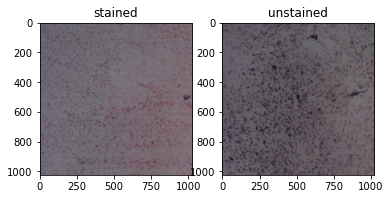

In [19]:
plt.subplot(121)
plt.title('stained')
plt.imshow(sample_stained[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('unstained')
plt.imshow(sample_unstained[0] * 0.5 + 0.5)

## Import and reuse the Pix2Pix models

Import the generator and the discriminator used in [Pix2Pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py) via the installed [tensorflow_examples](https://github.com/tensorflow/examples) package.

The model architecture used in this tutorial is very similar to what was used in [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). Some of the differences are:

* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).
* The [CycleGAN paper](https://arxiv.org/abs/1703.10593) uses a modified `resnet` based generator. This tutorial is using a modified `unet` generator for simplicity.

There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here. 

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](images/cyclegan_model.png)

In [20]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


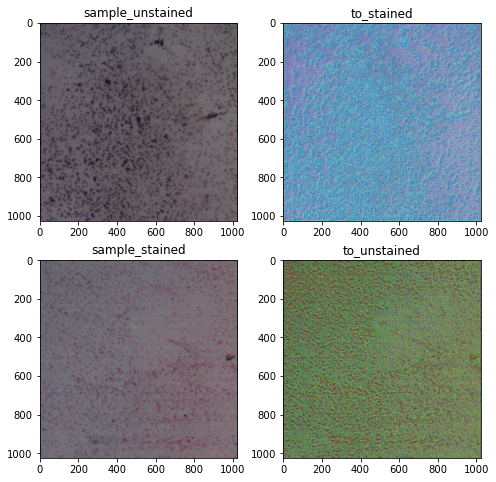

In [21]:
to_stained = generator_g(sample_unstained)
to_unstained = generator_f(sample_stained)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_unstained, to_stained, sample_stained, to_unstained]
title = ['sample_unstained', 'to_stained', 'sample_stained', 'to_unstained']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

<Figure size 576x576 with 0 Axes>

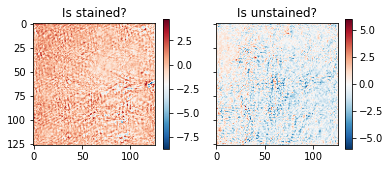

In [22]:
plt.figure(figsize=(8, 8))

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.set_title('Is stained?')
cax = ax1.imshow(discriminator_y(sample_stained)[0, ..., -1], cmap='RdBu_r')
fig.colorbar(cax, ax=ax1, shrink=0.6)

ax2.set_title('Is unstained?')
cax = ax2.imshow(discriminator_x(sample_unstained)[0, ..., -1], cmap='RdBu_r')
fig.colorbar(cax, ax=ax2, shrink=0.6)

plt.show()

In [23]:
generator_g.summary()
print(end='\n\n')
generator_f.summary()
print(end='\n\n')

discriminator_x.summary()
print(end='\n\n')
discriminator_y.summary()
print(end='\n\n')

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, None, None, 6 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, None, None, 1 131328      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, None, None, 2 524800      sequential_1[0][0]               
_______________________________________________________________________________________

## Loss functions

In CycleGAN, there is no paired data to train on, hence there is no guarantee that the input `x` and the target `y` pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.

The discriminator loss and the generator loss are similar to the ones used in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#define_the_loss_functions_and_the_optimizer).

In [24]:
LAMBDA = 10

In [25]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [26]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [27]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

Cycle consistency means the result should be close to the original input. For example, if one translates a sentence from English to French, and then translates it back from French to English, then the resulting sentence should be the same as the  original sentence.

In cycle consistency loss, 

* Image $X$ is passed via generator $G$ that yields generated image $\hat{Y}$.
* Generated image $\hat{Y}$ is passed via generator $F$ that yields cycled image $\hat{X}$.
* Mean absolute error is calculated between $X$ and $\hat{X}$.

$$forward\ cycle\ consistency\ loss: X -> G(X) -> F(G(X)) \sim \hat{X}$$

$$backward\ cycle\ consistency\ loss: Y -> F(Y) -> G(F(Y)) \sim \hat{Y}$$


![Cycle loss](images/cycle_loss.png)

In [28]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  
  return LAMBDA * loss1

As shown above, generator $G$ is responsible for translating image $X$ to image $Y$. Identity loss says that, if you fed image $Y$ to generator $G$, it should yield the real image $Y$ or something close to image $Y$.

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [29]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

Initialize the optimizers for all the generators and the discriminators.

In [30]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Checkpoints

In [31]:
checkpoint_path = "generated/checkpoints_cyclegan/"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=None)

## Training


In [33]:
EPOCHS = 40

Even though the training loop looks complicated, it consists of four basic steps:

* Get the predictions.
* Calculate the loss.
* Calculate the gradients using backpropagation.
* Apply the gradients to the optimizer.

In [34]:
import datetime
log_dir="generated/logs_cyclegan/"

summary_writer = tf.summary.create_file_writer(
  log_dir + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [35]:
@tf.function
def train_step(real_x, real_y, epoch):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    y_identity_loss = identity_loss(real_y, same_y)
    x_identity_loss = identity_loss(real_x, same_x)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + y_identity_loss
    total_gen_f_loss = gen_f_loss + total_cycle_loss + x_identity_loss

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))


  with summary_writer.as_default():
    tf.summary.scalar('gen_g_loss', gen_g_loss, step=epoch)
    tf.summary.scalar('gen_f_loss', gen_f_loss, step=epoch)
    tf.summary.scalar('total_cycle_loss', total_cycle_loss, step=epoch)
    tf.summary.scalar('total_gen_g_loss', total_gen_g_loss, step=epoch)
    tf.summary.scalar('total_gen_f_loss', total_gen_f_loss, step=epoch)
    tf.summary.scalar('disc_x_loss', disc_x_loss, step=epoch)
    tf.summary.scalar('disc_y_loss', disc_y_loss, step=epoch)
    tf.summary.scalar('x_identity_loss', x_identity_loss, step=epoch)
    tf.summary.scalar('y_identity_loss', y_identity_loss, step=epoch)

In [36]:
def generate_images(model, test_input):
  prediction = model(test_input)
    
  plt.figure(figsize=(12, 12))
  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

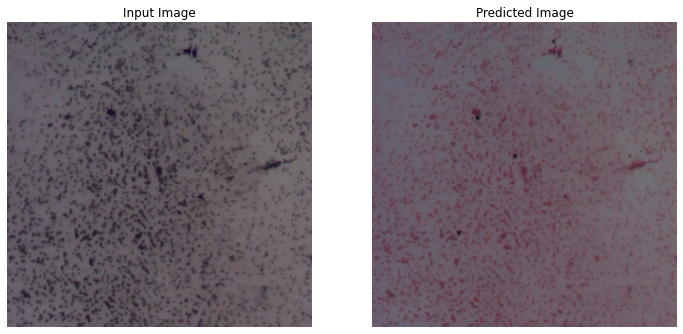

Saving checkpoint for epoch 10 at generated/checkpoints_cyclegan/ckpt-10
Time taken for epoch 10 is 634.1178007125854 sec

..................

In [ ]:
for epoch in range(EPOCHS):
    start = time.time()
    
    n = 0
    for image_x, image_y in tf.data.Dataset.zip((unstained_training_dataset, stained_training_dataset)):
        train_step(image_x, image_y, epoch)
        if n % 10 == 0:
            print ('.', end='')
        n+=1
    
    clear_output(wait=True)
    # Using a consistent image so that the progress of the model is clearly visible.
    generate_images(generator_g, sample_unstained)

    #if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))

## Predict from whole image dataset

In [39]:
'''
# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')
'''

my_checkpoint = 'generated/checkpoints_cyclegan/ckpt-17'
ckpt.restore(my_checkpoint)

43


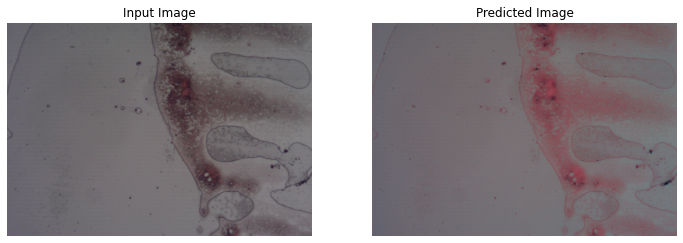

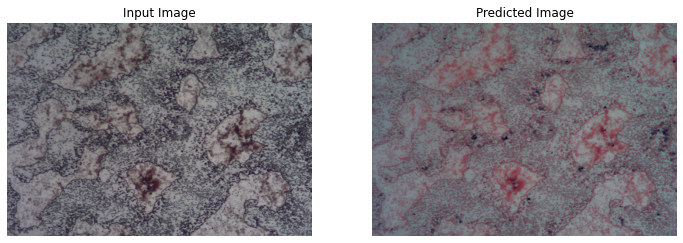

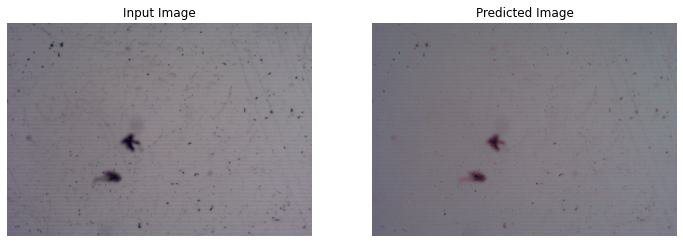

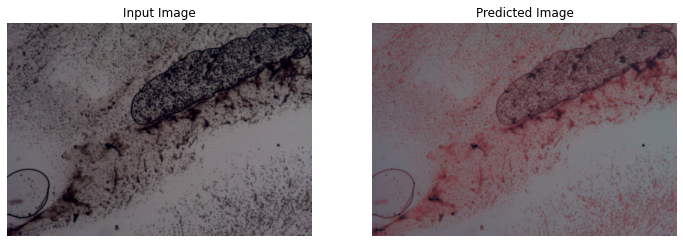

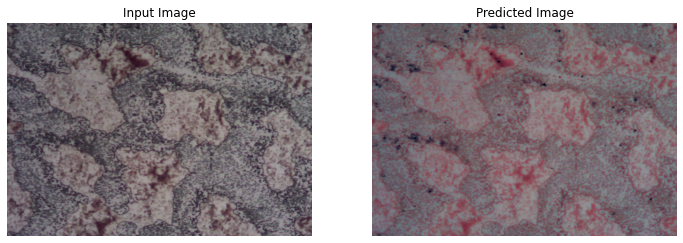

...

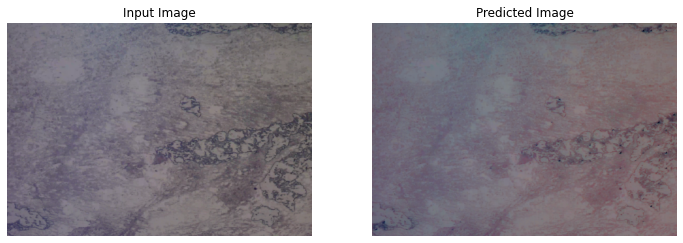

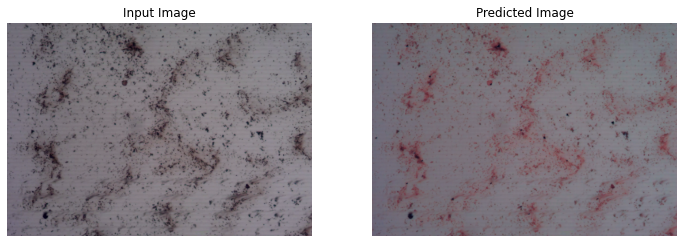

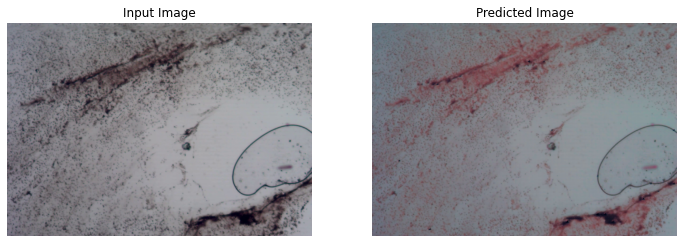

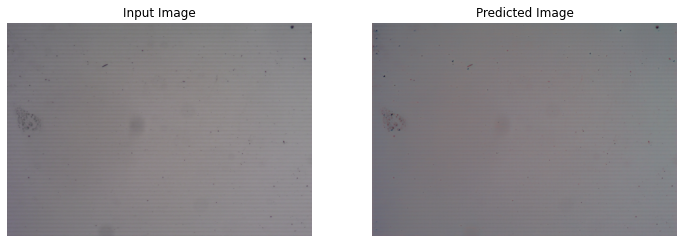

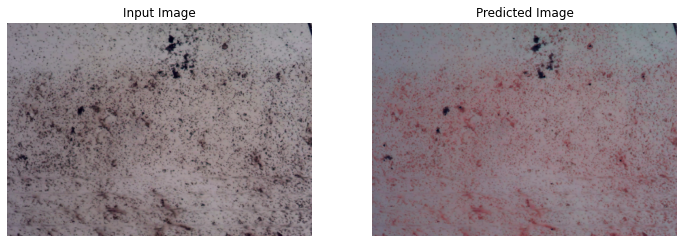

In [41]:
# Run the trained model on the test dataset
data_num = unstained_test_dataset.cardinality().numpy()
print(data_num)
for inp in unstained_test_dataset.take(data_num):
    inp = inp[0]
    inp = resize(inp[0], 1792, 2560)
    inp = tf.expand_dims(inp, axis=0)
    generate_images(generator_g, inp)

In [42]:
def save_prediction_image(model, input_image, save_path):
    input_image = resize(input_image[0], 1792, 2560)
    input_image = tf.expand_dims(input_image, axis=0)
    prediction = model(input_image)
    prediction = (prediction + 1) * 127.5
    prediction = prediction.numpy()
    cv2.imwrite(save_path, cv2.cvtColor(prediction[0], cv2.COLOR_RGB2BGR))
  

In [43]:
train_save_path = 'generated/stained_images_train/'
valid_save_path = 'generated/stained_images_valid/'
test_save_path = 'generated/stained_images_test/'

try:
    os.mkdir(train_save_path)
    os.mkdir(valid_save_path)
    os.mkdir(test_save_path)
except OSError:
    print ("Creation of the directory failed")
    

In [44]:
data_num = unstained_train_dataset.cardinality().numpy()
print(data_num)
for index, inp in enumerate(unstained_train_dataset.take(data_num)):
    print(index)
    input_image = inp[0]
    image_name = inp[1].numpy()[0].decode("utf-8")
    save_prediction_image(generator_g, input_image, train_save_path + image_name)


203
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202


In [45]:
data_num = unstained_valid_dataset.cardinality().numpy()
print(data_num)
for index, inp in enumerate(unstained_valid_dataset.take(data_num)):
    print(index)
    input_image = inp[0]
    image_name = inp[1].numpy()[0].decode("utf-8")
    save_prediction_image(generator_g, input_image, valid_save_path + image_name)

43
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42


In [46]:
data_num = unstained_test_dataset.cardinality().numpy()
print(data_num)
for index, inp in enumerate(unstained_test_dataset.take(data_num)):
    print(index)
    input_image = inp[0]
    image_name = inp[1].numpy()[0].decode("utf-8")
    save_prediction_image(generator_g, input_image, test_save_path + image_name)

43
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
